In [15]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')

In [6]:
df=pd.read_csv("wine.csv")
df

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [7]:
df.isna().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [8]:
print(df.head())
print(df.describe())


   Type  Alcohol  Malic   Ash  Alcalinity  Magnesium  Phenols  Flavanoids  \
0     1    14.23   1.71  2.43        15.6        127     2.80        3.06   
1     1    13.20   1.78  2.14        11.2        100     2.65        2.76   
2     1    13.16   2.36  2.67        18.6        101     2.80        3.24   
3     1    14.37   1.95  2.50        16.8        113     3.85        3.49   
4     1    13.24   2.59  2.87        21.0        118     2.80        2.69   

   Nonflavanoids  Proanthocyanins  Color   Hue  Dilution  Proline  
0           0.28             2.29   5.64  1.04      3.92     1065  
1           0.26             1.28   4.38  1.05      3.40     1050  
2           0.30             2.81   5.68  1.03      3.17     1185  
3           0.24             2.18   7.80  0.86      3.45     1480  
4           0.39             1.82   4.32  1.04      2.93      735  
             Type     Alcohol       Malic         Ash  Alcalinity   Magnesium  \
count  178.000000  178.000000  178.000000  178.0

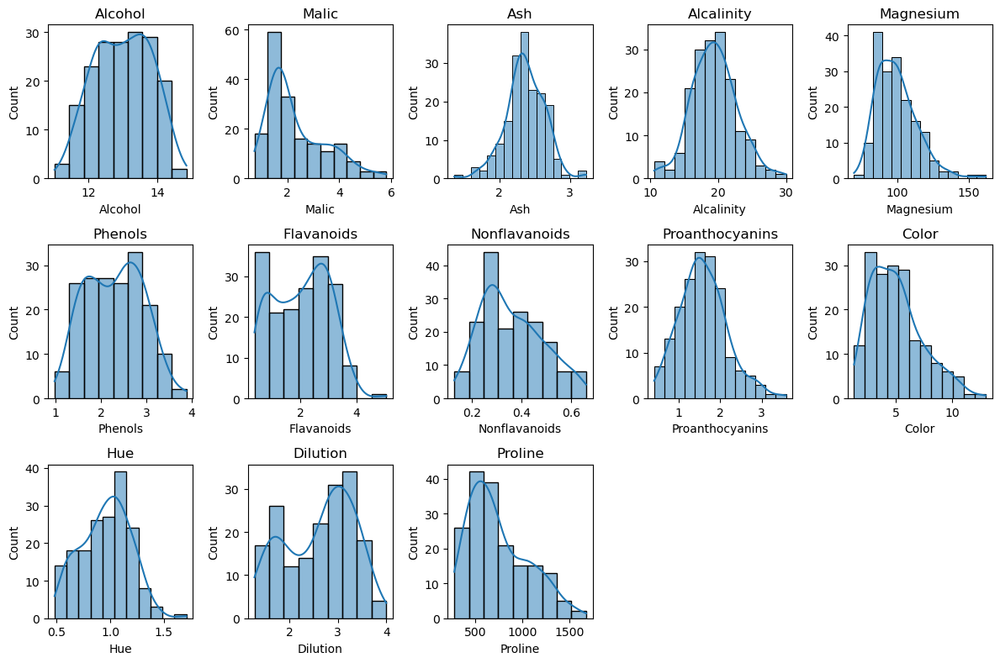

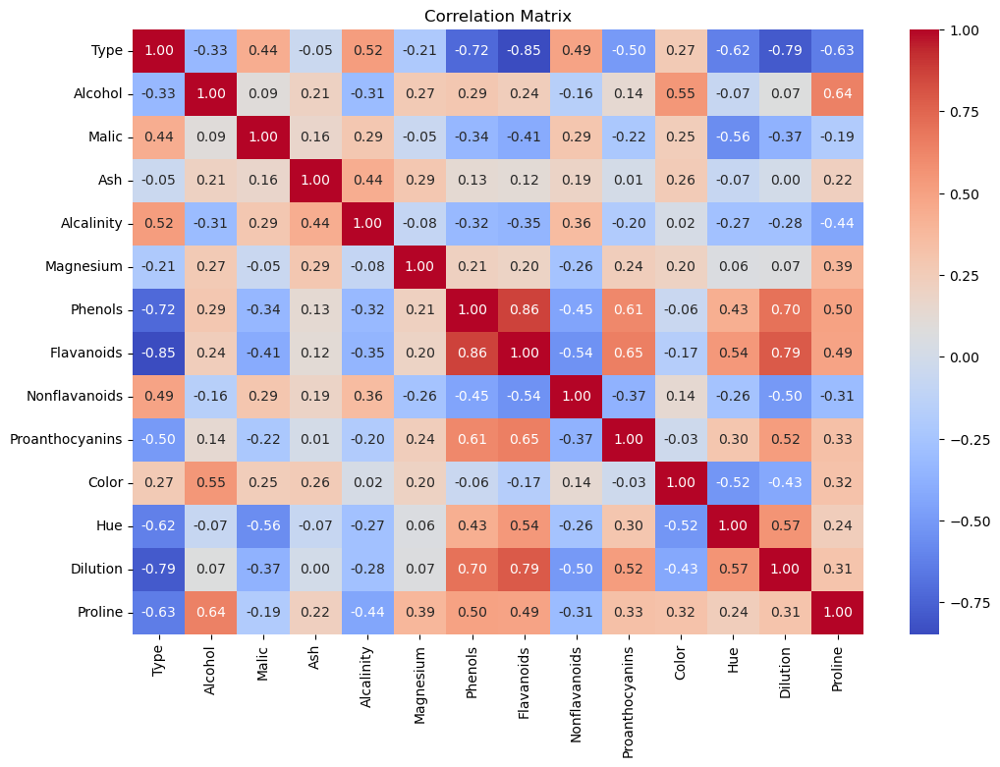

In [9]:
# Visualize feature distributions
plt.figure(figsize=(12, 8))
for i, col in enumerate(df.columns[1:], 1):
    plt.subplot(3, 5, i)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

# Investigate correlations between features
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

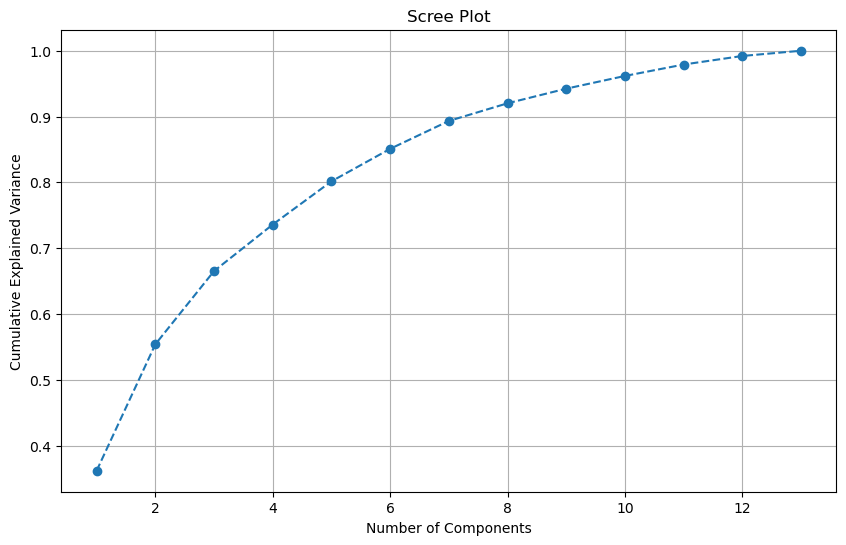

In [13]:
# Standardize features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df.drop('Type', axis=1))

# Perform PCA
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(scaled_features)

# Determine the optimal number of principal components
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()

# Transform the original dataset into principal components
n_components = 3  # chosen based on the scree plot or explained variance ratio
pca = PCA(n_components=n_components)
pca_features = pca.fit_transform(scaled_features)


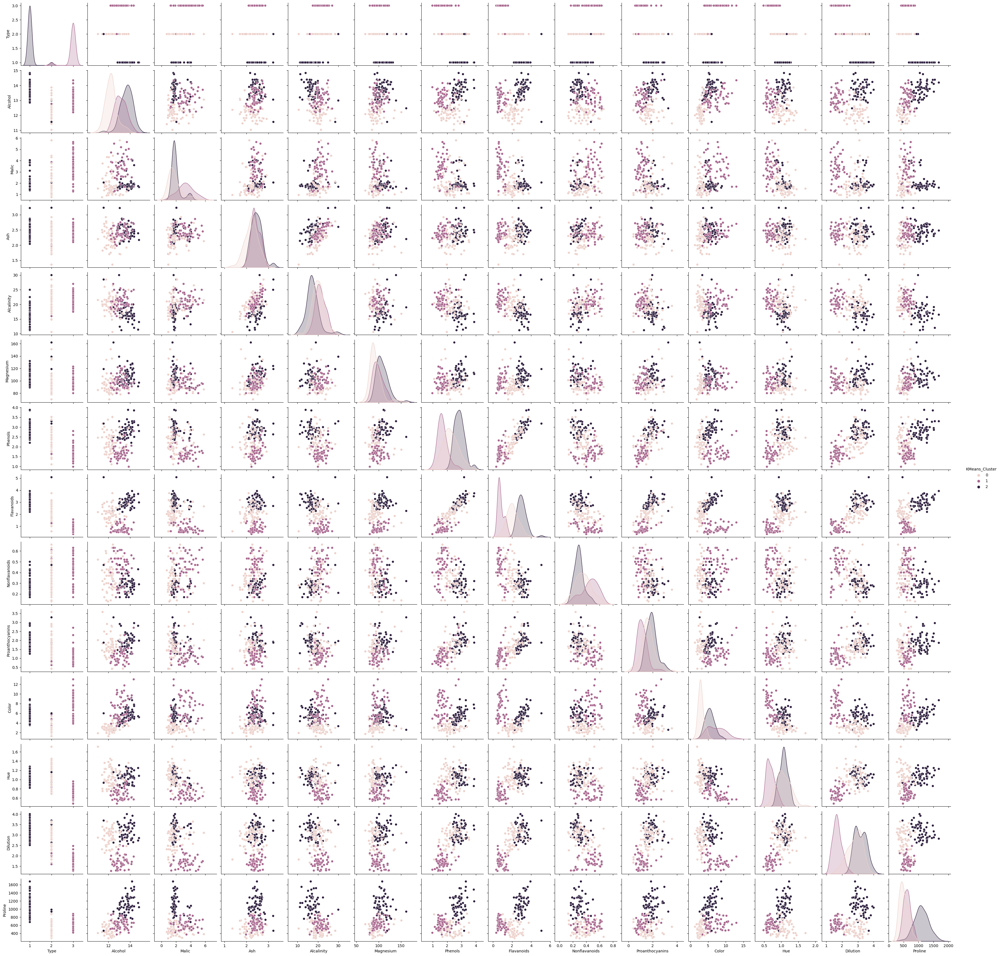

Silhouette Score (Original Data): 0.2848589191898987


In [16]:
# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['KMeans_Cluster'] = kmeans.fit_predict(scaled_features)

# Visualize clustering results
sns.pairplot(df, hue='KMeans_Cluster', diag_kind='kde')
plt.show()

# Evaluate clustering performance
silhouette_original = silhouette_score(scaled_features, df['KMeans_Cluster'])
print("Silhouette Score (Original Data):", silhouette_original)


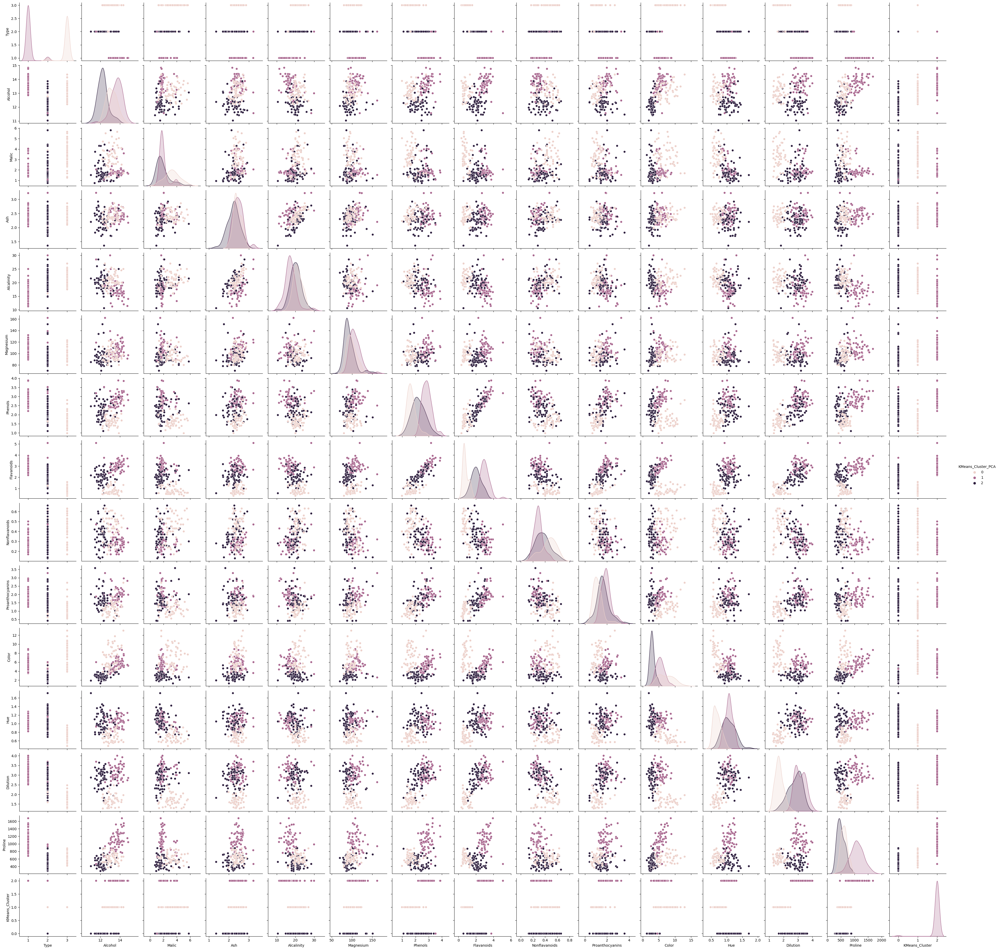

Silhouette Score (PCA Data): 0.4532351215683952


In [17]:
# Apply K-means clustering on PCA-transformed data
kmeans_pca = KMeans(n_clusters=3, random_state=42)
df['KMeans_Cluster_PCA'] = kmeans_pca.fit_predict(pca_features)

# Visualize clustering results on PCA-transformed data
sns.pairplot(df, hue='KMeans_Cluster_PCA', diag_kind='kde')
plt.show()

# Evaluate clustering performance on PCA-transformed data
silhouette_pca = silhouette_score(pca_features, df['KMeans_Cluster_PCA'])
print("Silhouette Score (PCA Data):", silhouette_pca)


In [18]:
# Comparison between original and PCA-transformed data
print("Silhouette Score (Original Data):", silhouette_original)
print("Silhouette Score (PCA Data):", silhouette_pca)


Silhouette Score (Original Data): 0.2848589191898987
Silhouette Score (PCA Data): 0.4532351215683952


The silhouette score for clustering on the original data is approximately 0.285, indicating moderate clustering quality.
Clustering on the PCA-transformed data yields a higher silhouette score of approximately 0.453, suggesting better-defined clusters.